<a href="https://colab.research.google.com/github/adhithyalakshman/DATAHACK/blob/main/DATAHACK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

BIOMETRIC SECTION






In [3]:
!pip install matplotlib seaborn



In [4]:
from google.colab import drive
drive.mount('/content/drive')
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import math

Mounted at /content/drive


In [5]:

#  data cleaning process
#  first file
file_path = '/content/drive/MyDrive/DATA HACK/BIOMETRIC/api_data_aadhar_biometric_0_500000.csv'
df1= pd.read_csv(file_path)

# second file
file_path = '/content/drive/MyDrive/DATA HACK/BIOMETRIC/api_data_aadhar_biometric_1000000_1500000.csv'
df2= pd.read_csv(file_path)

# third file
file_path = '/content/drive/MyDrive/DATA HACK/BIOMETRIC/api_data_aadhar_biometric_1500000_1861108.csv'
df3= pd.read_csv(file_path)

# fourth file file
file_path = '/content/drive/MyDrive/DATA HACK/BIOMETRIC/api_data_aadhar_biometric_500000_1000000.csv'
df4= pd.read_csv(file_path)

biodf=pd.concat([df1,df4,df2,df3],axis=0,ignore_index=True)
biodf["date"] = pd.to_datetime(
    biodf["date"],
    format="mixed",
    dayfirst=True
)
state_corrections = {
    # West Bengal Cluster
    'West  Bengal': 'West Bengal',
    'Westbengal': 'West Bengal',
    'WESTBENGAL': 'West Bengal',
    'West Bangal': 'West Bengal',
    'WEST BENGAL': 'West Bengal',
    'West bengal': 'West Bengal',
    'west Bengal': 'West Bengal',

    # Odisha Cluster
    'Orissa': 'Odisha',
    'ODISHA': 'Odisha',
    'odisha': 'Odisha',
    'ORISSA': 'Odisha',

    # Tamil Nadu Cluster
    'Tamilnadu': 'Tamil Nadu',

    # Puducherry Cluster
    'Pondicherry': 'Puducherry',

    # Uttarakhand Cluster
    'Uttaranchal': 'Uttarakhand',

    # Chhattisgarh Cluster
    'Chhatisgarh': 'Chhattisgarh',

    # Case & Symbol Fixes
    'andhra pradesh': 'Andhra Pradesh',
    'Jammu & Kashmir': 'Jammu and Kashmir',
    'Andaman & Nicobar Islands': 'Andaman and Nicobar Islands',

    # Merged UTs Cluster (Dadra & Nagar Haveli + Daman & Diu)
    'Dadra and Nagar Haveli': 'Dadra and Nagar Haveli and Daman and Diu',
    'Dadra & Nagar Haveli': 'Dadra and Nagar Haveli and Daman and Diu',
    'Daman and Diu': 'Dadra and Nagar Haveli and Daman and Diu',
    'Daman & Diu': 'Dadra and Nagar Haveli and Daman and Diu',
    'Dadra and Nagar Haveli and Daman and Diu': 'Dadra and Nagar Haveli and Daman and Diu'
}

# 2. Apply the replacement
# Note: strip() removes any accidental leading/trailing whitespace before replacing
biodf['state'] = biodf['state'].str.strip().replace(state_corrections)

biodf_sortby_date=biodf.sort_values(by='date',ignore_index=True)
biodf_sortby_date["bio_age_5_17"] = biodf_sortby_date["bio_age_5_17"].astype(int)
biodf_sortby_date["bio_age_17_"] = biodf_sortby_date["bio_age_17_"].astype(int)
biodf_sortby_date['total_count'] = biodf_sortby_date['bio_age_5_17'] + biodf_sortby_date['bio_age_17_']
#  ignoring case
biodf_sortby_date.head(5)


#  lack of data for union teritories

,date,state,district,pincode,bio_age_5_17,bio_age_17_,total_count
0,2025-03-01,Haryana,Mahendragarh,123029,280,577,857
1,2025-03-01,Uttar Pradesh,Ghazipur,233232,168,47,215
2,2025-03-01,West Bengal,West Midnapore,721133,47,153,200
3,2025-03-01,Gujarat,Anand,388335,24,70,94
4,2025-03-01,Rajasthan,Rajsamand,313322,79,76,155


BIO CHARTS  AND ANALYSIS

DEMOGRAPHIC  ANALYSIS ON BIOMETRIC ENROLEMENT

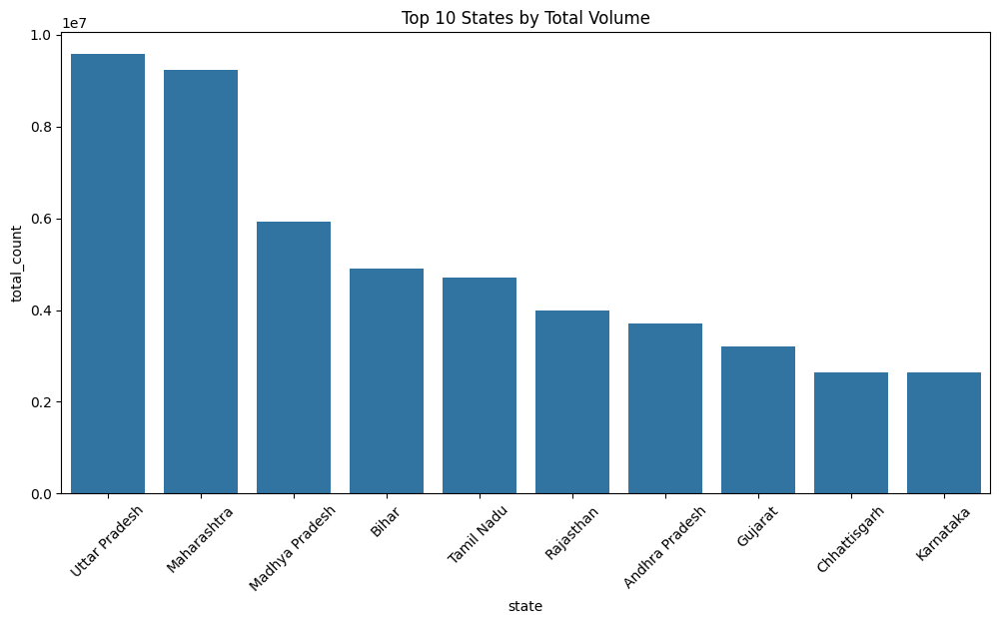

state           district        
Maharashtra     Pune                605762
                Nashik              576606
                Thane               571273
                Jalgaon             417384
Gujarat         Ahmedabad           405490
Maharashtra     Mumbai              404359
                Ahmadnagar          363561
Rajasthan       Jaipur              355884
Maharashtra     Nagpur              350923
Andhra Pradesh  Kurnool             350633
Maharashtra     Nanded              342540
                Amravati            338283
                Solapur             334507
                Yavatmal            327187
Delhi           North West Delhi    325293
Name: total_count, dtype: int64


In [6]:
# Aggregate by State
state_stats = biodf_sortby_date.groupby('state')[['bio_age_5_17', 'bio_age_17_', 'total_count']].sum().sort_values('total_count', ascending=False)

# Visualization: Top 10 States
plt.figure(figsize=(12, 6))
sns.barplot(x=state_stats.head(10).index, y=state_stats.head(10)['total_count'])
plt.title('Top 10 States by Total Volume')
plt.xticks(rotation=45)
plt.show()
# Top 15 Districts nationwide
top_districts = biodf_sortby_date.groupby(['state', 'district'])['total_count'].sum().sort_values(ascending=False).head(15)
print(top_districts)



Person Age analysis on biometric enrolement


Youngest Districts (Highest 5-17 concentration):
                                  bio_age_5_17  bio_age_17_  total_count  \
state             district                                                 
Andhra Pradesh    Ananthapuramu          90533        19069       109602   
Mizoram           Mamit                   8827         1888        10715   
Jammu and Kashmir Budgam                 18502         4609        23111   
Tripura           Gomati                 11757         2945        14702   
Tamil Nadu        Mayiladuthurai          3442          867         4309   

                                  youth_ratio  
state             district                     
Andhra Pradesh    Ananthapuramu      0.826016  
Mizoram           Mamit              0.823798  
Jammu and Kashmir Budgam             0.800571  
Tripura           Gomati             0.799687  
Tamil Nadu        Mayiladuthurai     0.798793  
State-wise Totals (Descending Order):
                                          to

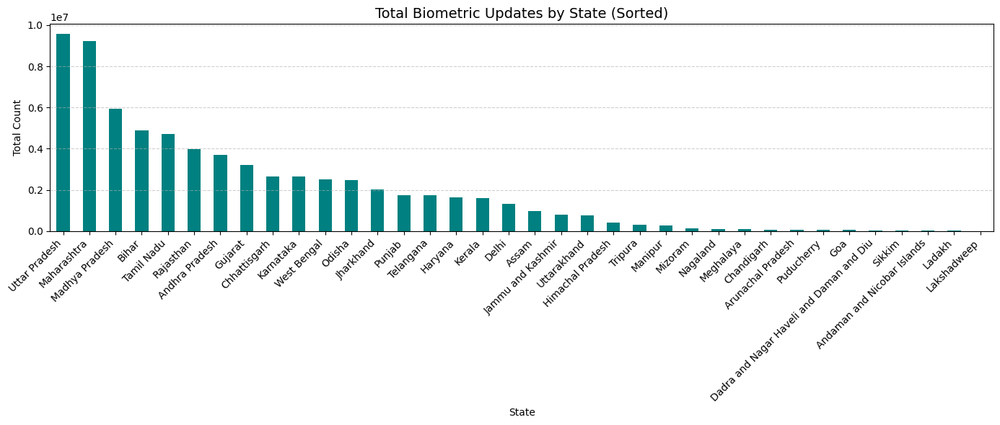

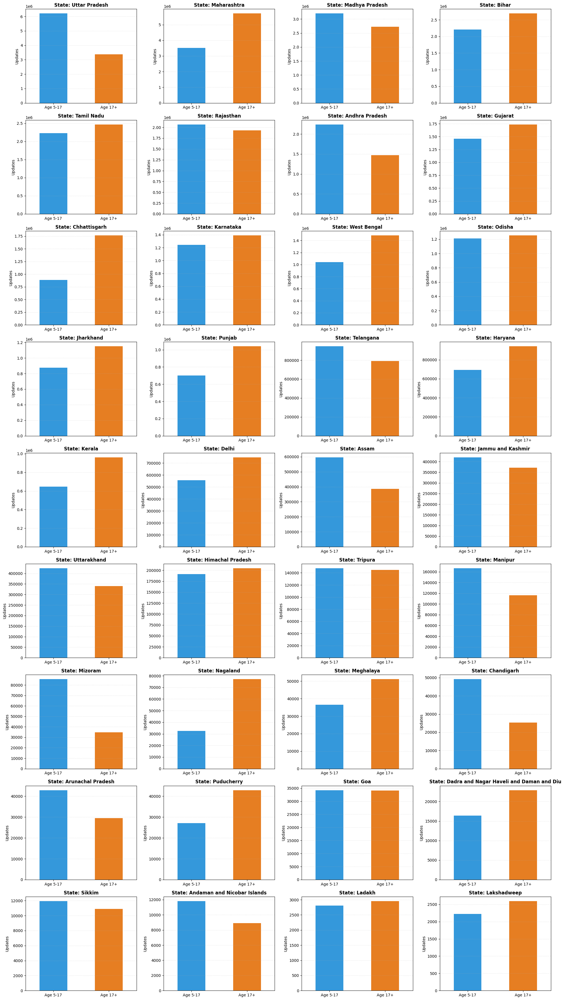

In [7]:
# Calculate Ratio
district_stats = biodf_sortby_date.groupby(['state', 'district'])[['bio_age_5_17', 'bio_age_17_', 'total_count']].sum()
district_stats['youth_ratio'] = district_stats['bio_age_5_17'] / district_stats['total_count']

# Filter for districts with significant data (e.g., total_count > 1000) to avoid skewed ratios from tiny samples
significant_districts = district_stats[district_stats['total_count'] > 1000]

# Find "Youngest" Districts
print("Youngest Districts (Highest 5-17 concentration):")
print(significant_districts.sort_values('youth_ratio', ascending=False).head(5))
#  age count for each state
state_stats = biodf_sortby_date.groupby('state')[['bio_age_5_17', 'bio_age_17_', 'total_count']].sum()
state_stats_sorted = state_stats.sort_values('total_count', ascending=False)

# --- VISUALIZATION 1: Common Bar Chart for all States (Total Count) ---
# This shows the overall volume per state in descending order
plt.figure(figsize=(14, 6))
state_stats_sorted['total_count'].plot(kind='bar', color='teal')
plt.title('Total Biometric Updates by State (Sorted)', fontsize=14)
plt.ylabel('Total Count')
plt.xlabel('State')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('total_updates_all_states.png')

# --- VISUALIZATION 2: Grid of Plots for Each State (Age Comparison) ---
# We create a grid to compare 5-17 vs 17+ updates within each state
states = state_stats_sorted.index.tolist()
num_states = len(states)
cols = 4  # Number of columns in the grid
rows = math.ceil(num_states / cols)

fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
axes = axes.flatten()

for i, state in enumerate(states):
    ax = axes[i]
    # Select the specific columns for the state
    age_data = state_stats_sorted.loc[state, ['bio_age_5_17', 'bio_age_17_']]

    # Plotting the two bars
    age_data.plot(kind='bar', ax=ax, color=['#3498db', '#e67e22'])

    ax.set_title(f'State: {state}', fontsize=12, fontweight='bold')
    ax.set_ylabel('Updates')
    ax.set_xticklabels(['Age 5-17', 'Age 17+'], rotation=0)
    ax.grid(axis='y', linestyle=':', alpha=0.5)

# Turn off any unused axes in the grid
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('state_age_comparison_grid.png')

# --- PRINT SUMMARY DATA ---
print("State-wise Totals (Descending Order):")
print(state_stats_sorted[['total_count', 'bio_age_5_17', 'bio_age_17_']])

# Find which state has more updates in each category
print(f"\nState with highest 5-17 updates: {state_stats['bio_age_5_17'].idxmax()}")
print(f"State with highest 17+ updates: {state_stats['bio_age_17_'].idxmax()}")

Trend analysis


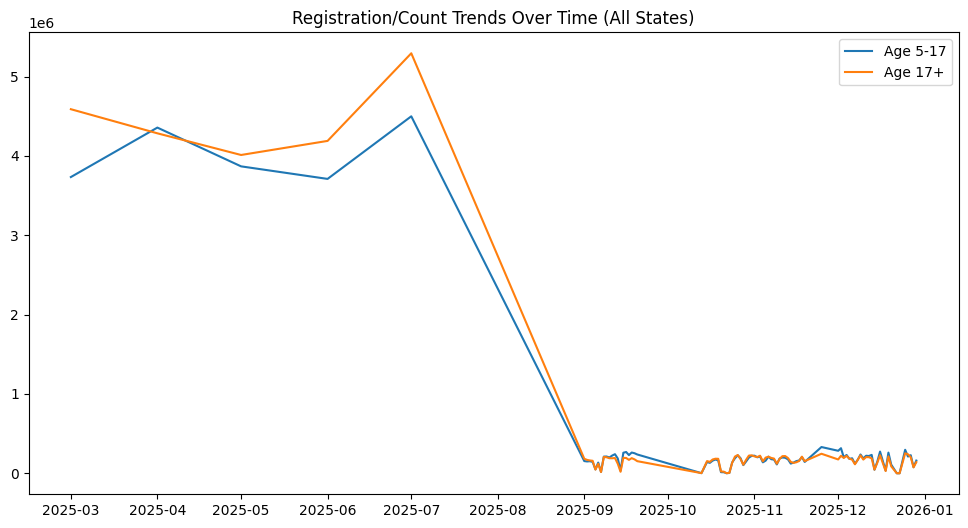

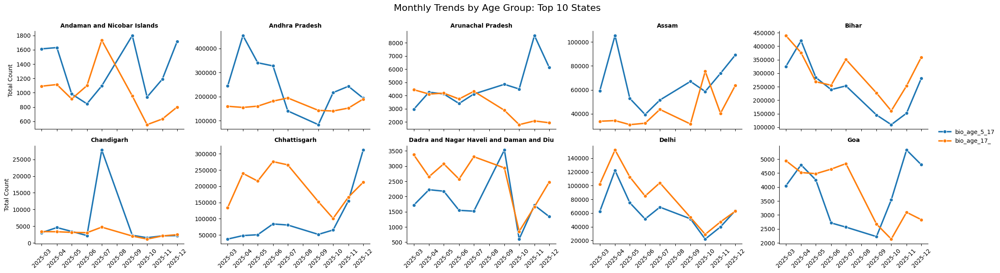

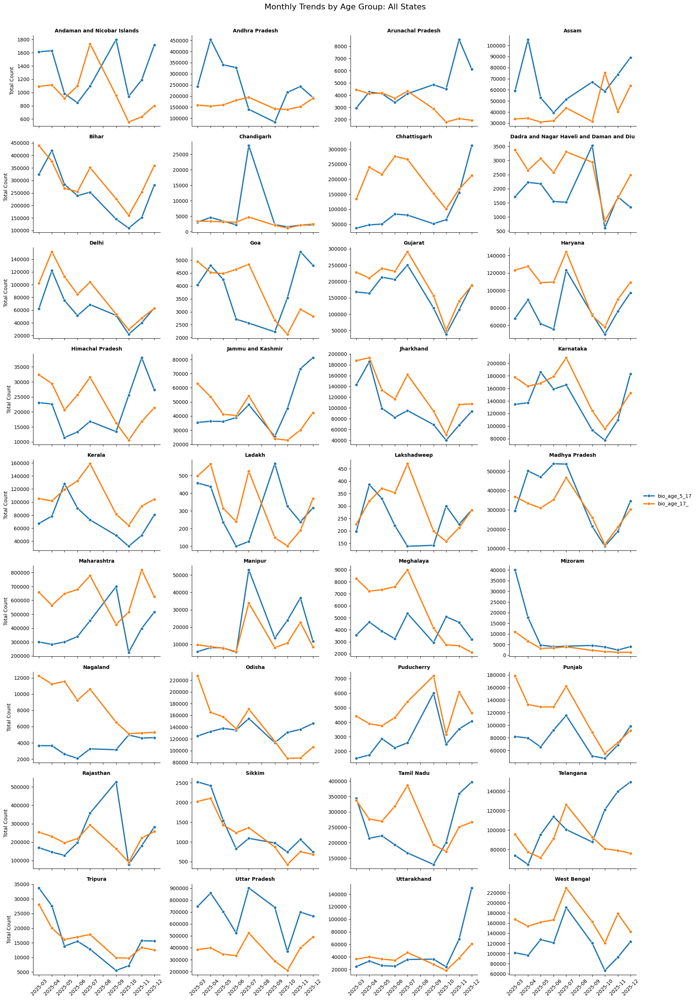

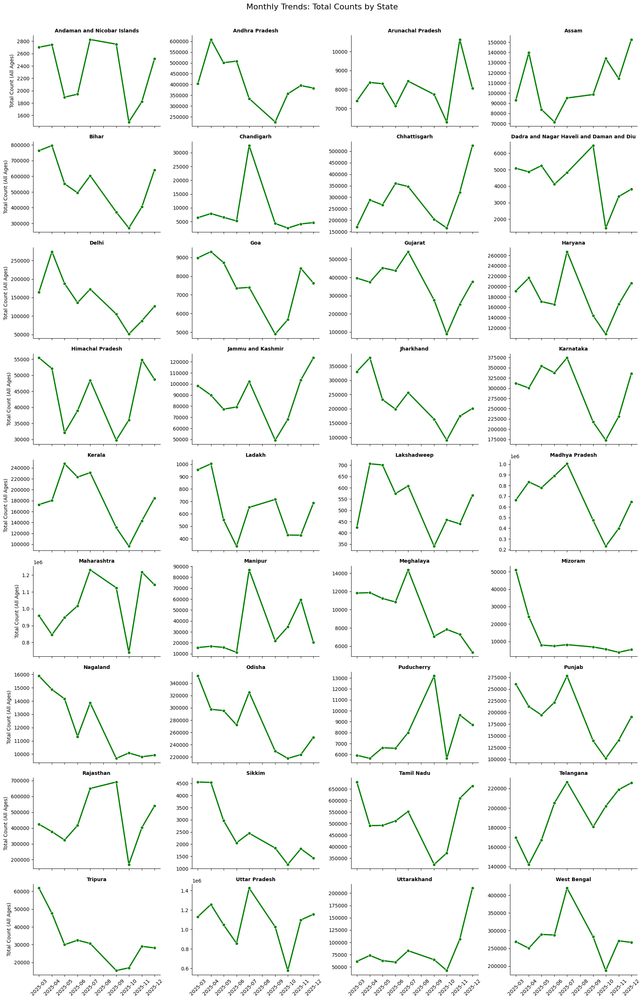

In [8]:
time_trends = biodf_sortby_date.groupby('date')[['bio_age_5_17', 'bio_age_17_']].sum()

# Plot Overall Trends
plt.figure(figsize=(12, 6))
plt.plot(time_trends.index, time_trends['bio_age_5_17'], label='Age 5-17')
plt.plot(time_trends.index, time_trends['bio_age_17_'], label='Age 17+')
plt.title('Registration/Count Trends Over Time (All States)')
plt.legend()
plt.show()

#  Top 10 States Monthly Trends with Age specific

# 1. Filter for Top 10 States
top_10_names = state_stats.head(10).index.tolist()
df_top10 = biodf_sortby_date[biodf_sortby_date['state'].isin(top_10_names)].copy()

# 2. Create Month Column for aggregation
df_top10['month'] = df_top10['date'].dt.to_period('M').dt.to_timestamp()

# 3. Group by State & Month, summing BOTH age columns

monthly_trends = df_top10.groupby(['state', 'month'])[['bio_age_5_17', 'bio_age_17_']].sum().reset_index()

# 4. Melt the data (Crucial Step)

monthly_melted = monthly_trends.melt(
    id_vars=['state', 'month'],
    value_vars=['bio_age_5_17', 'bio_age_17_'],
    var_name='Age_Group',
    value_name='Count'
)

# 5. Plot using FacetGrid
g = sns.FacetGrid(
    monthly_melted,       # Use the melted dataframe here
    col="state",
    col_wrap=5,
    height=3,
    aspect=1.5,
    sharey=False          # Each state has its own Y-axis scale
)

# Use map_dataframe to allow 'hue' (colors) for different age groups
g.map_dataframe(sns.lineplot, x="month", y="Count", hue="Age_Group", marker="o", linewidth=2.5)

# Formatting
g.set_titles("{col_name}", fontweight='bold')
g.set_axis_labels("", "Total Count")
g.add_legend()  # Adds the legend to distinguish the two lines

for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

g.fig.suptitle('Monthly Trends by Age Group: Top 10 States', fontsize=16, y=1.05)
plt.show()
#  for all states  trend analysis
df_all = biodf_sortby_date.copy()

# 2. Create Month Column for aggregation
df_all['month'] = df_all['date'].dt.to_period('M').dt.to_timestamp()

# 3. Group by State & Month, summing BOTH age columns
all_monthly_trends = df_all.groupby(['state', 'month'])[['bio_age_5_17', 'bio_age_17_']].sum().reset_index()

# 4. Melt the data (Crucial Step for Seaborn 'hue')
all_melted = all_monthly_trends.melt(
    id_vars=['state', 'month'],
    value_vars=['bio_age_5_17', 'bio_age_17_'],
    var_name='Age_Group',
    value_name='Count'
)

# 5. Plot using FacetGrid for ALL states
# Note: If you have many states, consider increasing col_wrap or reducing height
g_all = sns.FacetGrid(
    all_melted,
    col="state",
    col_wrap=4,      # Adjusted to 4 to prevent the plot from being too wide
    height=3,
    aspect=1.5,
    sharey=False     # Essential: Allows small states to show trends clearly independent of big states
)

# Map the lineplot
g_all.map_dataframe(sns.lineplot, x="month", y="Count", hue="Age_Group", marker="o", linewidth=2.5)

# Formatting
g_all.set_titles("{col_name}", fontweight='bold')
g_all.set_axis_labels("", "Total Count")
g_all.add_legend()

# Rotate x-axis labels for readability
for ax in g_all.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

# Adjust title position to not overlap with the top row of charts
g_all.fig.suptitle('Monthly Trends by Age Group: All States', fontsize=16, y=1.02)

plt.show()
 #  trend in total count
all_monthly_trends['total_count'] = all_monthly_trends['bio_age_5_17'] + all_monthly_trends['bio_age_17_']

# 2. Plot using FacetGrid for All States (Total Count)
g_total = sns.FacetGrid(
    all_monthly_trends,
    col="state",
    col_wrap=4,      # 4 charts per row
    height=3,
    aspect=1.5,
    sharey=False     # Essential: States have vastly different population sizes
)

# 3. Map the lineplot
# We use a specific color (e.g., 'green') since there is only one line per chart
g_total.map(sns.lineplot, "month", "total_count", marker="o", linewidth=2.5, color='green')

# 4. Formatting
g_total.set_titles("{col_name}", fontweight='bold')
g_total.set_axis_labels("", "Total Count (All Ages)")

# Rotate x-axis labels for readability
for ax in g_total.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(45)

# Adjust title position
g_total.fig.suptitle('Monthly Trends: Total Counts by State', fontsize=16, y=1.02)

plt.show()




DEMOGRAPHIC


In [9]:
import pandas as pd
import numpy as np
#  first file
file_path = '/content/drive/MyDrive/DATA HACK/DEMOGRAPHIC/api_data_aadhar_demographic_0_500000.csv'
df1= pd.read_csv(file_path)

# second file
file_path = '/content/drive/MyDrive/DATA HACK/DEMOGRAPHIC/api_data_aadhar_demographic_1000000_1500000.csv'
df2= pd.read_csv(file_path)

# third file
file_path = '/content/drive/MyDrive/DATA HACK/DEMOGRAPHIC/api_data_aadhar_demographic_1500000_2000000.csv'
df3= pd.read_csv(file_path)

# fourth file
file_path = '/content/drive/MyDrive/DATA HACK/DEMOGRAPHIC/api_data_aadhar_demographic_2000000_2071700.csv'
df4= pd.read_csv(file_path)
#  fifth file
file_path = '/content/drive/MyDrive/DATA HACK/DEMOGRAPHIC/api_data_aadhar_demographic_500000_1000000.csv'
df5= pd.read_csv(file_path)

demodf=pd.concat([df1,df5,df2,df3,df4],axis=0,ignore_index=True)

demodf["date"] = pd.to_datetime(
    demodf["date"],
    format="mixed",
    dayfirst=True
)
demodf = demodf[demodf["state"] != '100000']
state_corrections = {
    # West Bengal Cluster
    'West  Bengal': 'West Bengal',
    'Westbengal': 'West Bengal',
    'WESTBENGAL': 'West Bengal',
    'West Bangal': 'West Bengal',
    'WEST BENGAL': 'West Bengal',
    'West bengal': 'West Bengal',
    'west Bengal': 'West Bengal',
    'West Bengli': 'West Bengal',

    # Odisha Cluster
    'Orissa': 'Odisha',
    'ODISHA': 'Odisha',
    'odisha': 'Odisha',

    # Typos & Old Names
    'Chhatisgarh': 'Chhattisgarh',
    'Uttaranchal': 'Uttarakhand',
    'Pondicherry': 'Puducherry',
    'andhra pradesh': 'Andhra Pradesh',

    # Symbol Fixes (& to and)
    'Jammu & Kashmir': 'Jammu and Kashmir',
    'Andaman & Nicobar Islands': 'Andaman and Nicobar Islands',

    # Merged UTs Cluster
    'Dadra and Nagar Haveli': 'Dadra and Nagar Haveli and Daman and Diu',
    'Dadra & Nagar Haveli': 'Dadra and Nagar Haveli and Daman and Diu',
    'Daman and Diu': 'Dadra and Nagar Haveli and Daman and Diu',
    'Daman & Diu': 'Dadra and Nagar Haveli and Daman and Diu',

    # Mapping Cities/Localities to States
    'BALANAGAR': 'Telangana',
    'Darbhanga': 'Bihar',
    'Puttenahalli': 'Karnataka',
    'Nagpur': 'Maharashtra',
    'Jaipur': 'Rajasthan',
    'Raja Annamalai Puram': 'Tamil Nadu',
    'Madanapalle': 'Andhra Pradesh'
}

# 2. Apply the replacement
# .strip() handles hidden spaces, .replace() fixes the names
demodf['state'] = demodf['state'].str.strip().replace(state_corrections)
demodf_sortby_date=demodf.sort_values(by='date',ignore_index=True)
demodf_sortby_date["demo_age_5_17"] = demodf_sortby_date["demo_age_5_17"].astype(int)
demodf_sortby_date["demo_age_17_"] = demodf_sortby_date["demo_age_17_"].astype(int)
demodf_sortby_date['total_count'] = demodf_sortby_date['demo_age_5_17'] + demodf_sortby_date['demo_age_17_']
demodf_sortby_date.columns





Index(['date', 'state', 'district', 'pincode', 'demo_age_5_17', 'demo_age_17_',
       'total_count'],
      dtype='object')

DEMOGRAPHIC UPDATE TREND

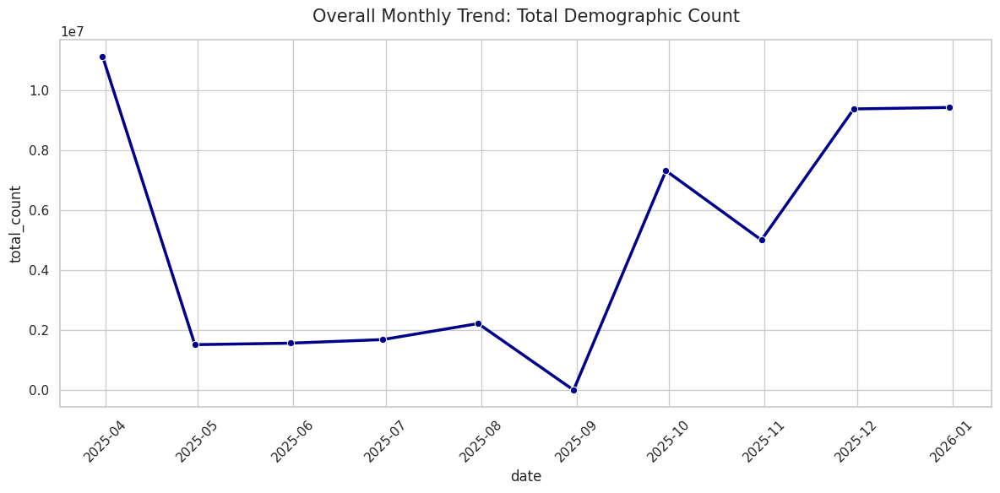

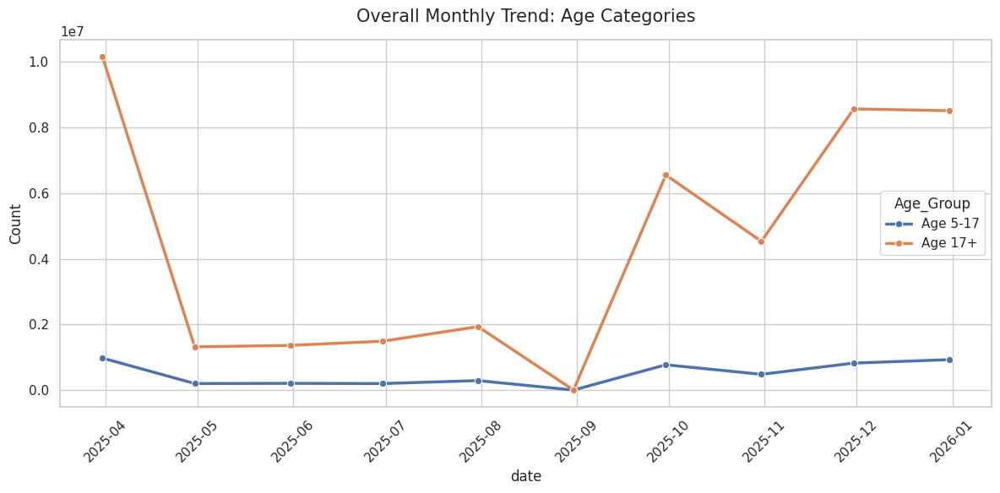

In [10]:
cols_to_keep = ['date', 'total_count', 'demo_age_5_17', 'demo_age_17_']

overall_monthly = (
    demodf_sortby_date[cols_to_keep]
    .groupby(pd.Grouper(key='date', freq='ME'))
    .sum(numeric_only=True)
    .reset_index()
)

# Set general figure settings
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

# --- PLOT 1: Overall Total Count Trend ---
plt.figure()
sns.lineplot(data=overall_monthly, x='date', y='total_count', marker='o', color='darkblue', linewidth=2.5)
plt.title('Overall Monthly Trend: Total Demographic Count', fontsize=15, pad=15)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# --- PLOT 2: Overall Age-wise Trend ---
# Note: Melting here is fast because overall_monthly only has ~12-24 rows (one per month)
overall_melted = overall_monthly.melt(
    id_vars=['date'],
    value_vars=['demo_age_5_17', 'demo_age_17_'],
    var_name='Age_Group',
    value_name='Count'
)

# Efficient mapping for labels
overall_melted['Age_Group'] = overall_melted['Age_Group'].map({
    'demo_age_5_17': 'Age 5-17',
    'demo_age_17_': 'Age 17+'
})

plt.figure()
sns.lineplot(data=overall_melted, x='date', y='Count', hue='Age_Group', marker='o', linewidth=2.5)
plt.title('Overall Monthly Trend: Age Categories', fontsize=15, pad=15)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

DEMOGRAPHIC UPDATE GEOGRAPHICAL ANALYSIS


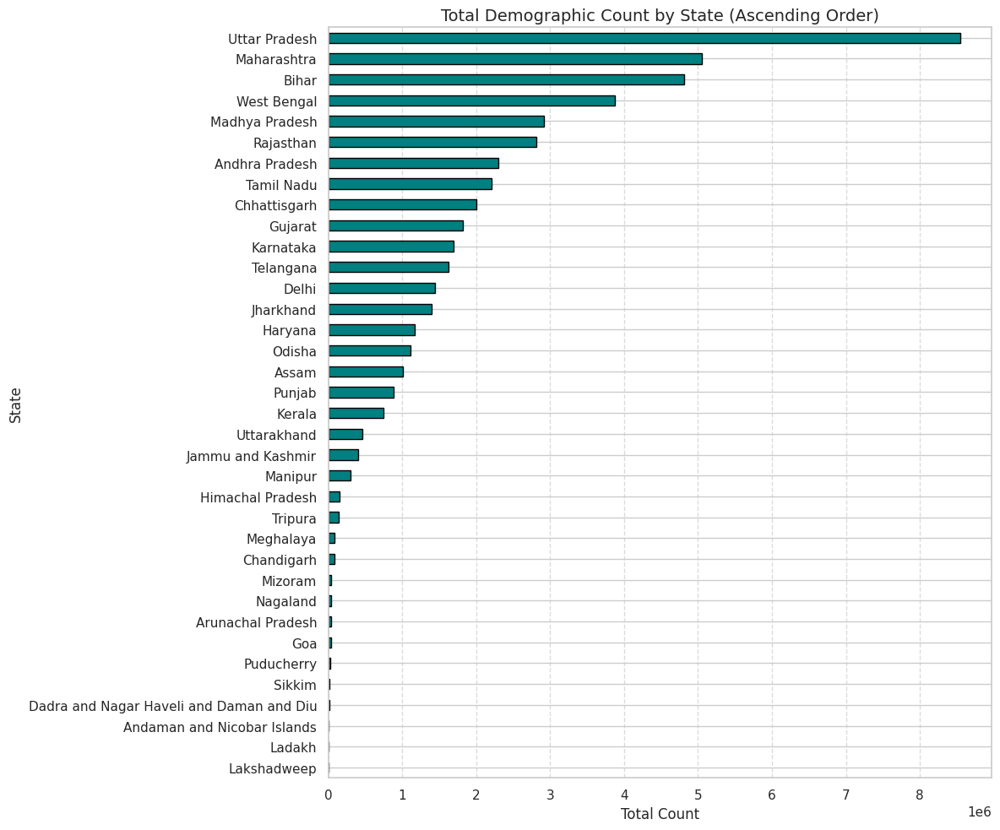

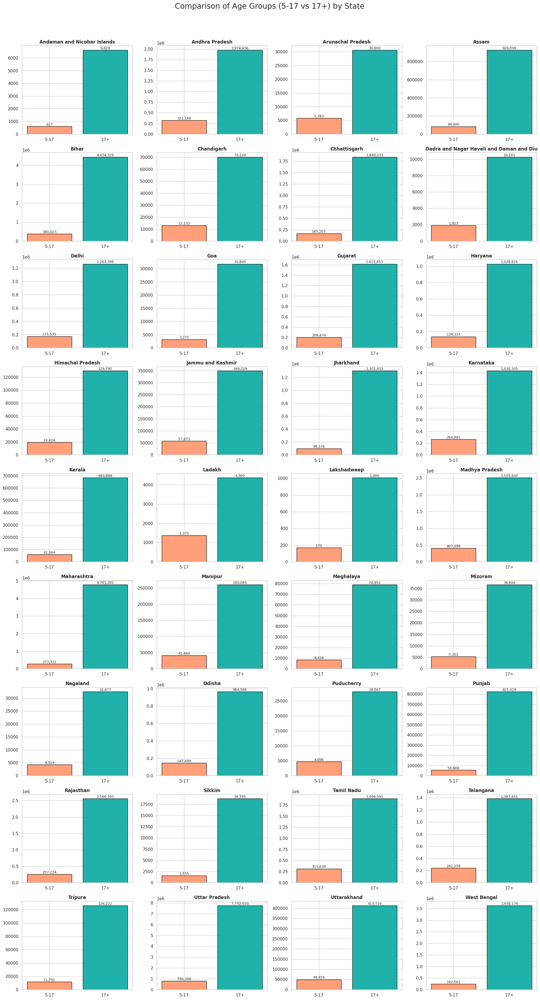

In [11]:
#  statewise total  count
state_totals = demodf_sortby_date.groupby('state')['total_count'].sum().sort_values()

# Create the plot
plt.figure(figsize=(12, 10))
state_totals.plot(kind='barh', color='teal', edgecolor='black')

plt.title('Total Demographic Count by State (Ascending Order)', fontsize=14)
plt.xlabel('Total Count', fontsize=12)
plt.ylabel('State', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

#  for each state count analysis
age_comparison = demodf_sortby_date.groupby('state')[['demo_age_5_17', 'demo_age_17_']].sum().reset_index()

# Define grid dimensions (calculating rows based on number of states)
num_states = len(age_comparison)
cols = 4
rows = math.ceil(num_states / cols)

# Create the figure
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 4))
axes = axes.flatten()

# Colors for the two age groups
colors = ['#FFA07A', '#20B2AA'] # Light Salmon and Light Sea Green

for i, (idx, row) in enumerate(age_comparison.iterrows()):
    ax = axes[i]
    labels = ['5-17', '17+']
    values = [row['demo_age_5_17'], row['demo_age_17_']]

    ax.bar(labels, values, color=colors, edgecolor='black')
    ax.set_title(row['state'], fontsize=12, fontweight='bold')

    # Optional: Add data labels on top of bars
    for j, v in enumerate(values):
        ax.text(j, v + (max(values)*0.01), f'{v:,}', ha='center', fontsize=9)

# Remove empty subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Comparison of Age Groups (5-17 vs 17+) by State', fontsize=20, y=1.02)
plt.tight_layout()
plt.show()

DEMOGRAPHIC  PERSON AGE      ANALYSIS


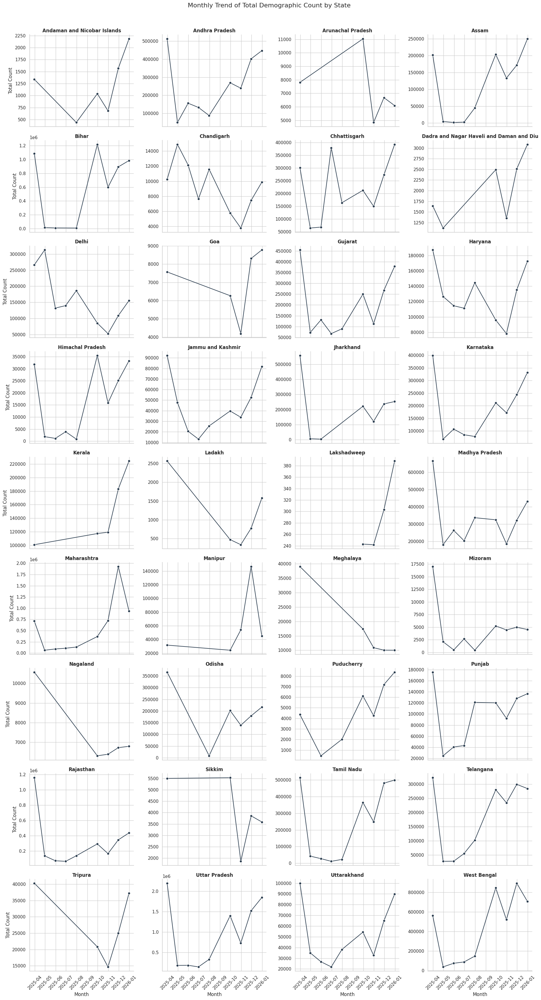

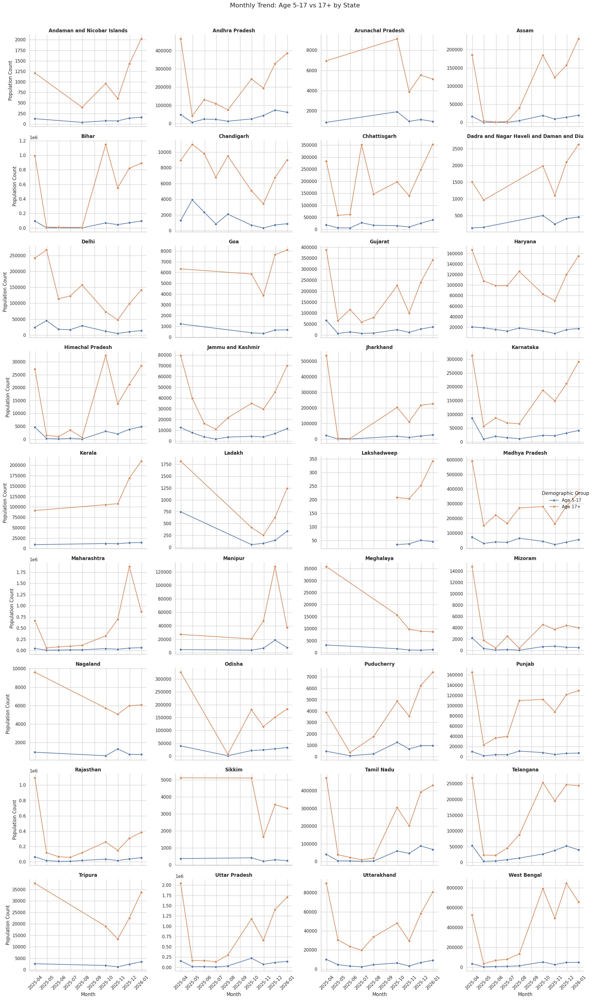

In [12]:
monthly_data = demodf_sortby_date.groupby(['state', pd.Grouper(key='date', freq='ME')]).sum().reset_index()

# Set the visual style
sns.set_theme(style="whitegrid")

# --- GRID 1: Monthly Trend of Total Count for each State ---
# col_wrap controls how many plots appear in one row
g1 = sns.FacetGrid(monthly_data, col="state", col_wrap=4, height=4, aspect=1.2, sharey=False)
g1.map(sns.lineplot, "date", "total_count", marker='o', color='#2c3e50')

g1.set_titles(col_template="{col_name}", size=12, weight='bold')
g1.set_axis_labels("Month", "Total Count")
for ax in g1.axes.flat:
    ax.tick_params(axis='x', rotation=45)

g1.fig.tight_layout(rect=[0, 0, 1, 0.96])
g1.fig.suptitle('Monthly Trend of Total Demographic Count by State', fontsize=16)
plt.show()

# --- GRID 2: Comparison of Age Categories (5-17 vs 17+) for each State ---
# First, reshape the data for seaborn (melting age columns into one)
melted_df = monthly_data.melt(
    id_vars=['state', 'date'],
    value_vars=['demo_age_5_17', 'demo_age_17_'],
    var_name='Age_Category',
    value_name='Count'
)

# Clean up names for the legend
melted_df['Age_Category'] = melted_df['Age_Category'].replace({
    'demo_age_5_17': 'Age 5-17',
    'demo_age_17_': 'Age 17+'
})

g2 = sns.FacetGrid(melted_df, col="state", col_wrap=4, height=4, aspect=1.2, sharey=False)
g2.map_dataframe(sns.lineplot, x="date", y="Count", hue="Age_Category", marker='o')

g2.set_titles(col_template="{col_name}", size=12, weight='bold')
g2.set_axis_labels("Month", "Population Count")
g2.add_legend(title="Demographic Group")
for ax in g2.axes.flat:
    ax.tick_params(axis='x', rotation=45)

g2.fig.tight_layout(rect=[0, 0, 1, 0.96])
g2.fig.suptitle('Monthly Trend: Age 5-17 vs 17+ by State', fontsize=16)
plt.show()

ENROLEMENT


In [20]:
import pandas as pd
import numpy as np
#  first file
file_path = '/content/drive/MyDrive/DATA HACK/ENROLEMENT/api_data_aadhar_enrolment_0_500000.csv'
df1= pd.read_csv(file_path)

# second file
file_path = '/content/drive/MyDrive/DATA HACK/ENROLEMENT/api_data_aadhar_enrolment_1000000_1006029.csv'
df2= pd.read_csv(file_path)

# third file
file_path = '/content/drive/MyDrive/DATA HACK/ENROLEMENT/api_data_aadhar_enrolment_500000_1000000.csv'
df3= pd.read_csv(file_path)



enroledf=pd.concat([df1,df3,df2],axis=0,ignore_index=True)
enroledf["date"] = pd.to_datetime(
    enroledf["date"],
    format="mixed",
    dayfirst=True
)

enroledf =enroledf[enroledf["state"] != '100000']
state_corrections = {
    # West Bengal Cluster
    'WEST BENGAL': 'West Bengal',
    'West  Bengal': 'West Bengal',
    'West Bangal': 'West Bengal',
    'Westbengal': 'West Bengal',
    'West bengal': 'West Bengal',
    'WESTBENGAL': 'West Bengal',

    # Odisha Cluster
    'Orissa': 'Odisha',
    'ODISHA': 'Odisha',

    # Old Names & Casing
    'Pondicherry': 'Puducherry',
    'andhra pradesh': 'Andhra Pradesh',

    # Symbol & Casing Fixes for J&K
    'Jammu & Kashmir': 'Jammu and Kashmir',
    'Jammu And Kashmir': 'Jammu and Kashmir',  # Fixes Capital 'A'

    # Symbol Fixes for Andaman
    'Andaman & Nicobar Islands': 'Andaman and Nicobar Islands',

    # Merged UTs Cluster (Dadra... & Daman...)
    'The Dadra And Nagar Haveli And Daman And Diu': 'Dadra and Nagar Haveli and Daman and Diu', # Removes 'The'
    'Dadra and Nagar Haveli': 'Dadra and Nagar Haveli and Daman and Diu',
    'Dadra & Nagar Haveli': 'Dadra and Nagar Haveli and Daman and Diu',
    'Daman and Diu': 'Dadra and Nagar Haveli and Daman and Diu',
    'Daman & Diu': 'Dadra and Nagar Haveli and Daman and Diu'
}

# 2. Apply the replacement
# .strip() is crucial here to handle 'West  Bengal' (double space) correctly
enroledf['state'] = enroledf['state'].str.strip().replace(state_corrections)
enroledf_sortby_date=enroledf.sort_values(by='date',ignore_index=True)
enroledf_sortby_date["age_0_5"] = enroledf_sortby_date["age_0_5"].astype(int)
enroledf_sortby_date["age_5_17"] = enroledf_sortby_date["age_5_17"].astype(int)
enroledf_sortby_date["age_18_greater"] = enroledf_sortby_date["age_18_greater"].astype(int)
enroledf_sortby_date['total_count'] = enroledf_sortby_date['age_5_17'] + enroledf_sortby_date['age_0_5'] + enroledf_sortby_date['age_18_greater']





,date,state,district,pincode,age_0_5,age_5_17,age_18_greater,total_count
6680,2025-09-01,Puducherry,Pondicherry,605106,1,0,0,1
6681,2025-09-01,Puducherry,Pondicherry,605502,8,0,0,8
6682,2025-09-01,Puducherry,Pondicherry,673310,2,0,0,2
6683,2025-09-01,Puducherry,Puducherry,605003,2,0,0,2
6684,2025-09-01,Puducherry,Puducherry,605013,1,0,0,1
...,...,...,...,...,...,...,...,...
1002073,2025-12-31,Puducherry,Pondicherry,605004,1,0,0,1
1005488,2025-12-31,Puducherry,Pondicherry,607402,1,0,0,1
1005489,2025-12-31,Puducherry,Puducherry,605502,1,0,0,1
1005490,2025-12-31,Puducherry,Puducherry,673310,0,2,0,2


ENROLEMENT   TREND ANALYSIS


Optimization Complete. Monthly Aggregated Summary:
            age_0_5  age_5_17  age_18_greater  total_count
date                                                      
2025-08-31        0         0               0            0
2025-09-30   995612    465401           14854      1475867
2025-10-31   562856    238957           16106       817919
2025-11-30   769156    297658           25182      1091996
2025-12-31   560183    184655           14626       759464


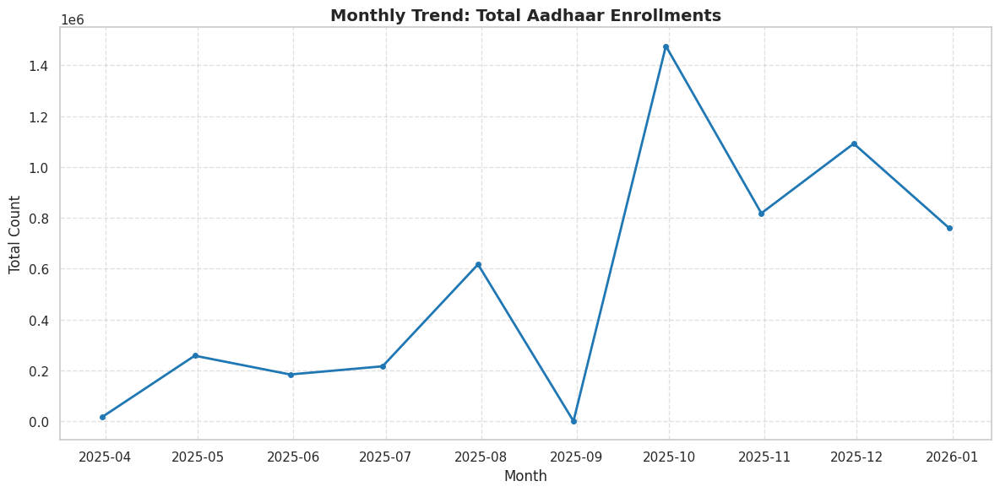

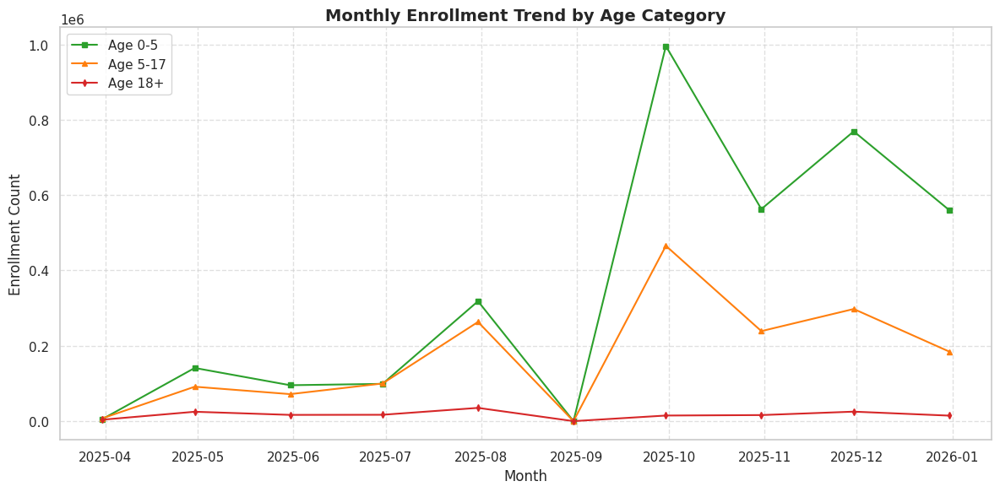

In [14]:
# Converting counts to the smallest possible unsigned integer types to save RAM
cols_to_sum = ['age_0_5', 'age_5_17', 'age_18_greater', 'total_count']
for col in cols_to_sum:
    enroledf_sortby_date[col] = pd.to_numeric(enroledf_sortby_date[col], downcast='unsigned')

# 2. Aggregation: Group by Month
# Optimization: Select ONLY the necessary columns before resampling to avoid overhead
monthly_trend = (
    enroledf_sortby_date[['date'] + cols_to_sum]
    .resample('ME', on='date')
    .sum()
)

# ---------------------------------------------------------
# Plot 1: Monthly Total Enrollment Count
# ---------------------------------------------------------
plt.figure(figsize=(12, 6))
plt.plot(
    monthly_trend.index,
    monthly_trend['total_count'],
    marker='o',
    markersize=4,
    color='#1f77b4',
    linestyle='-',
    linewidth=2
)

plt.title('Monthly Trend: Total Aadhaar Enrollments', fontsize=14, fontweight='bold')
plt.xlabel('Month', fontsize=12)
plt.ylabel('Total Count', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('total_enrollment_trend.png', dpi=300) # High DPI for clarity

# ---------------------------------------------------------
# Plot 2: Monthly Age Category Analysis
# ---------------------------------------------------------
plt.figure(figsize=(12, 6))
plt.plot(monthly_trend.index, monthly_trend['age_0_5'], marker='s', markersize=4, label='Age 0-5', color='#2ca02c')
plt.plot(monthly_trend.index, monthly_trend['age_5_17'], marker='^', markersize=4, label='Age 5-17', color='#ff7f0e')
plt.plot(monthly_trend.index, monthly_trend['age_18_greater'], marker='d', markersize=4, label='Age 18+', color='#d62728')

plt.title('Monthly Enrollment Trend by Age Category', fontsize=14, fontweight='bold')
plt.xlabel('Month', fontsize=12)
plt.ylabel('Enrollment Count', fontsize=12)
plt.legend(loc='upper left', frameon=True)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig('age_category_trend.png', dpi=300)

# Displaying summary for verification
print("Optimization Complete. Monthly Aggregated Summary:")
print(monthly_trend.tail())

ENROLEMENT DEMOGRAPHIC ANALYSIS

/tmp/ipython-input-4022559023.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=state_totals, x='total_count', y='state', palette='viridis', ax=ax)


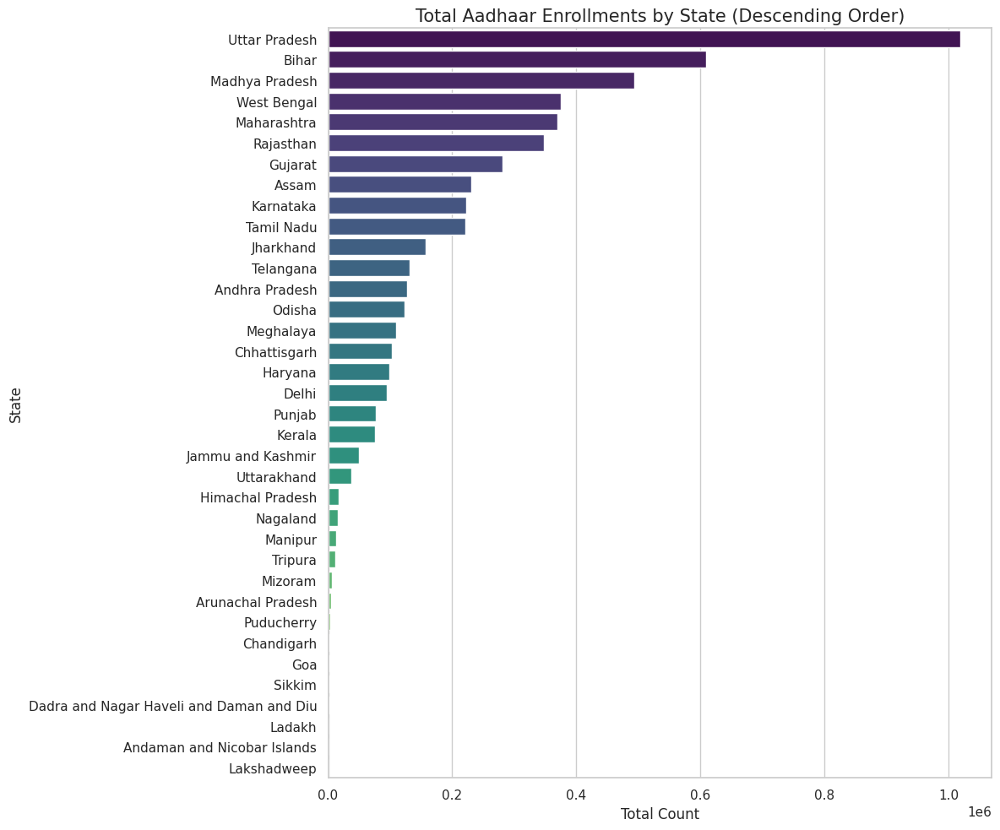

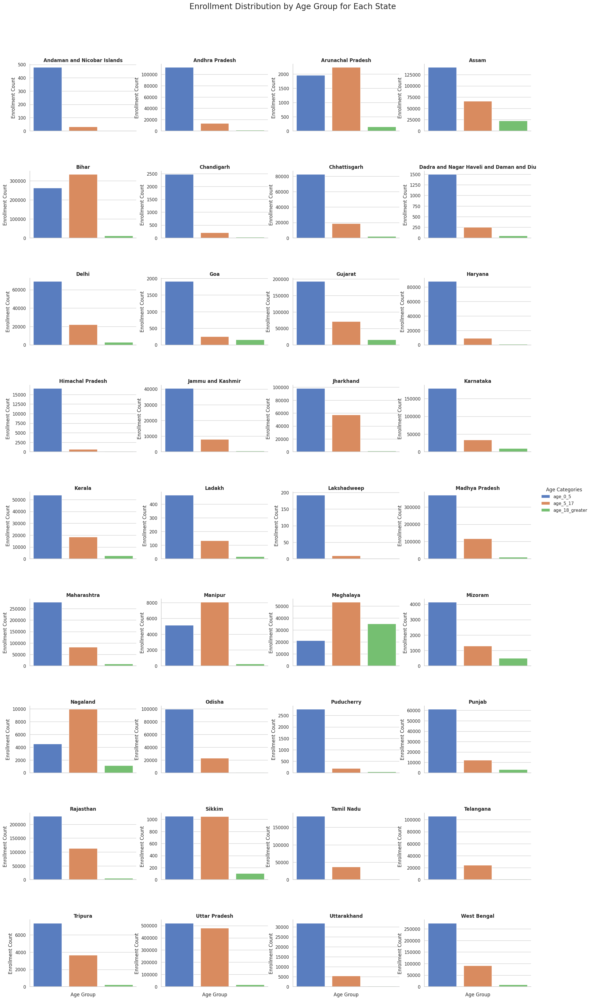

In [16]:
# 1st   plot  showing  total  count for  each state
#  Prepare State Totals for the first plot
state_totals = enroledf_sortby_date.groupby('state')['total_count'].sum().sort_values(ascending=False).reset_index()

#  Plotting the total count per state
fig, ax = plt.subplots(figsize=(12, 10))
sns.barplot(data=state_totals, x='total_count', y='state', palette='viridis', ax=ax)
ax.set_title('Total Aadhaar Enrollments by State (Descending Order)', fontsize=15)
ax.set_xlabel('Total Count', fontsize=12)
ax.set_ylabel('State', fontsize=12)
plt.tight_layout()
plt.savefig('state_enrollments_descending.png')


#2   for each state age category count
#  Prepare data for age category analysis
age_columns = ['age_0_5', 'age_5_17', 'age_18_greater']
state_age_dist = enroledf_sortby_date.groupby('state')[age_columns].sum().reset_index()

# 4. Melt the dataframe to make it suitable for FacetGrid
melted_age_df = state_age_dist.melt(id_vars='state',
                                    value_vars=age_columns,
                                    var_name='Age_Group',
                                    value_name='Count')

#  Create a grid of plots
# Added 'hue' mapping to Age_Group to give each category a unique color
g = sns.FacetGrid(melted_age_df, col="state", col_wrap=4, height=4, sharey=False, aspect=1.2, hue='Age_Group', palette='muted')

# Mapping the barplot; the 'order' ensures the age groups appear in the same sequence everywhere
g.map(sns.barplot, "Age_Group", "Count", order=age_columns)

#  Final formatting
g.set_titles("{col_name}", fontweight='bold')
g.set_xticklabels(rotation=45)

# Adding a legend to clearly identify categories across the entire grid
g.add_legend(title="Age Categories")

# Formatting the axes and fixing the previous syntax error
for ax in g.axes.flat:
    ax.ticklabel_format(style='plain', axis='y') # Remove scientific notation
    ax.set_xlabel('Age Group')
    ax.set_ylabel('Enrollment Count')

# Adjust layout: 'right' is reduced to 0.9 to make room for the legend
plt.subplots_adjust(top=0.92, hspace=0.6, right=0.9)
g.fig.suptitle('Enrollment Distribution by Age Group for Each State', fontsize=20)

# Save the grid plot
plt.savefig('state_age_distribution_grid.png')
plt.show()

ENROLEMENT   PERSON AGE ANALYSIS

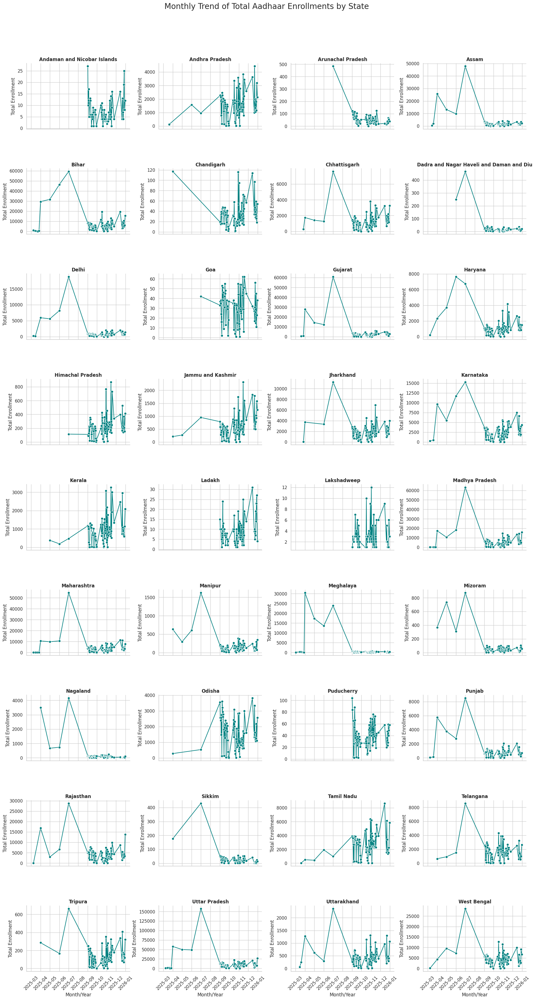

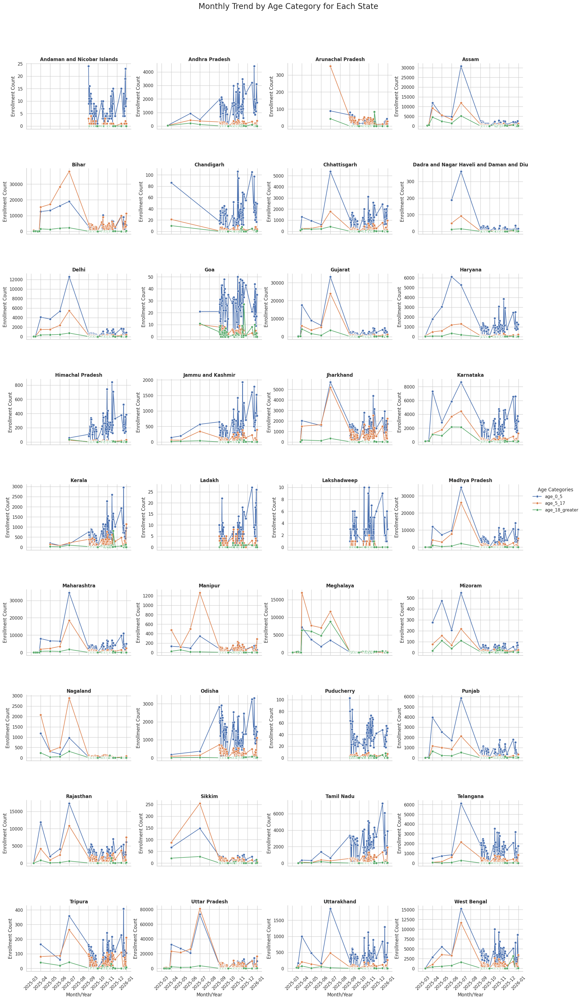

In [18]:
#  for  each state analysing the trend
# Group by state and date to get monthly totals
state_monthly_trend = enroledf_sortby_date.groupby(['state', 'date'])['total_count'].sum().reset_index()

# Create the Grid Plot for Total Count Trend
g1 = sns.FacetGrid(state_monthly_trend, col="state", col_wrap=4, height=4, sharey=False, aspect=1.2)
g1.map(sns.lineplot, "date", "total_count", marker='o', color='teal')

# Formatting
g1.set_titles("{col_name}", fontweight='bold')
for ax in g1.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel('Month/Year')
    ax.set_ylabel('Total Enrollment')

plt.subplots_adjust(top=0.92, hspace=0.6)
g1.fig.suptitle('Monthly Trend of Total Aadhaar Enrollments by State', fontsize=20)
plt.savefig('state_total_trend_grid.png')
plt.show()
#  age category wise trend analysis for each state
# Prepare data: Group by state and date for the three age columns
age_trend_df = enroledf_sortby_date.groupby(['state', 'date'])[age_columns].sum().reset_index()

# Melt the data so Age_Group becomes a column for the 'hue' parameter
melted_age_trend = age_trend_df.melt(id_vars=['state', 'date'],
                                     value_vars=age_columns,
                                     var_name='Age_Category',
                                     value_name='Count')

# Create the Grid Plot for Categorical Trends
# We use 'hue' to separate the 3 age categories by color within each state plot
g2 = sns.FacetGrid(melted_age_trend, col="state", col_wrap=4, height=4, sharey=False, aspect=1.2, hue='Age_Category')
g2.map(sns.lineplot, "date", "Count", marker='o')

# Formatting
g2.set_titles("{col_name}", fontweight='bold')
g2.add_legend(title="Age Categories") # Adds the legend for the 3 categories

for ax in g2.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    ax.set_xlabel('Month/Year')
    ax.set_ylabel('Enrollment Count')

plt.subplots_adjust(top=0.92, hspace=0.6, right=0.9)
g2.fig.suptitle('Monthly Trend by Age Category for Each State', fontsize=20)
plt.savefig('state_categorical_trend_grid.png')
plt.show()